# Text to image with FLUX-1.1-pro in Azure AI Foundry

https://techcommunity.microsoft.com/blog/azure-ai-foundry-blog/black-forest-labs-flux-1-kontext-pro-and-flux1-1-pro-now-available-in-azure-ai-f/4434659



In [1]:
import base64
import json
import matplotlib.pyplot as plt
import os
import requests
import sys
import time

from datetime import datetime
from dotenv import load_dotenv
from pathlib import Path
from PIL import Image

In [2]:
load_dotenv("azure.env")

endpoint = os.getenv("endpoint")
key = os.getenv("key")

In [3]:
IMAGES_DIR = "images"

os.makedirs(IMAGES_DIR, exist_ok=True)

In [4]:
sys.version

'3.10.18 (main, Jun  5 2025, 13:14:17) [GCC 11.2.0]'

## Helper

In [5]:
def generate_image(prompt, filename_prefix, **kwargs):
    """Generate image with Flux 1.1 Pro"""

    headers = {
        "Content-Type": "application/json",
        "Authorization": f"Bearer {key}"
    }

    payload = {
        "prompt": prompt,
        "output_format": "png",
        "n": 1,
        "size": "1024x1024",
        **kwargs  # Allow override of defaults
    }

    print(f"\n🎨 Generating: {filename_prefix}")
    print(f"📝 Text prompt: {prompt}")
    print(
        f"⚙️ Parameters: {json.dumps({k: v for k, v in payload.items() if k != 'prompt'}, indent=2)}"
    )

    try:
        response = requests.post(endpoint,
                                 headers=headers,
                                 json=payload,
                                 timeout=60)

        if response.status_code == 200:
            result = response.json()
            image_base64 = result["data"][0]["b64_json"]
            image_bytes = base64.b64decode(image_base64)

            # Save with timestamp
            timestamp = datetime.now().strftime("%H%M%S")
            filename = os.path.join(IMAGES_DIR,
                                    f"{filename_prefix}_{timestamp}.png")

            with open(filename, "wb") as f:
                f.write(image_bytes)

            print(f"✅ OK. Image saved: {filename}")

            return filename
        else:
            print(f"❌ Error {response.status_code}: {response.text}")
            return None

    except requests.exceptions.Timeout:
        print("⏰ Request timed out")
        return None
    except Exception as e:
        print(f"💥 Unexpected error: {e}")
        return None

In [6]:
def display_images(directory_path,
                   prefix,
                   figsize=(15, 10),
                   cols=3):
    """
    Display image files from a directory that start with a specific substring.
    
    Args:
        directory_path (str): Path to the directory containing images
        prefix (str): Substring that filenames should start with
        figsize (tuple): Figure size for the plot (width, height)
        cols (int): Number of columns in the grid
    """
    # Common image extensions
    image_extensions = {
        '.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp'
    }

    # Get image files that start with the prefix
    image_files = []
    for filename in os.listdir(directory_path):
        if (filename.lower().startswith(prefix.lower())
                and os.path.splitext(filename.lower())[1] in image_extensions):
            image_files.append(os.path.join(directory_path, filename))

    if not image_files:
        print(
            f"No image files starting with '{prefix}' found in the directory.")
        return

    # Sort files for consistent ordering
    image_files.sort()
    # Calculate rows needed
    rows = (len(image_files) + cols - 1) // cols
    # Create subplots
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    # Handle case where there's only one subplot
    if rows == 1 and cols == 1:
        axes = [axes]
    elif rows == 1 or cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()

    # Display images
    for i, img_path in enumerate(image_files):
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(os.path.basename(img_path), fontsize=10)
            axes[i].axis('off')
        except Exception as e:
            axes[i].text(0.5,
                         0.5,
                         f'Error loading\n{os.path.basename(img_path)}',
                         ha='center',
                         va='center',
                         transform=axes[i].transAxes)
            axes[i].axis('off')

    # Hide empty subplots
    for i in range(len(image_files), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Displayed {len(image_files)} images starting with '{prefix}'")

## Tests

In [7]:
prompt = """ A professional headshot of a 55-year-old software engineer man with glasses, sitting at a modern desk with dual monitors, 
natural window lighting, shot with Canon 5D Mark IV, 85mm lens, shallow depth of field, corporate environment
"""

imagefile = generate_image(prompt, "test")


🎨 Generating: test
📝 Text prompt:  A professional headshot of a 55-year-old software engineer man with glasses, sitting at a modern desk with dual monitors, 
natural window lighting, shot with Canon 5D Mark IV, 85mm lens, shallow depth of field, corporate environment

⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/test_092208.png


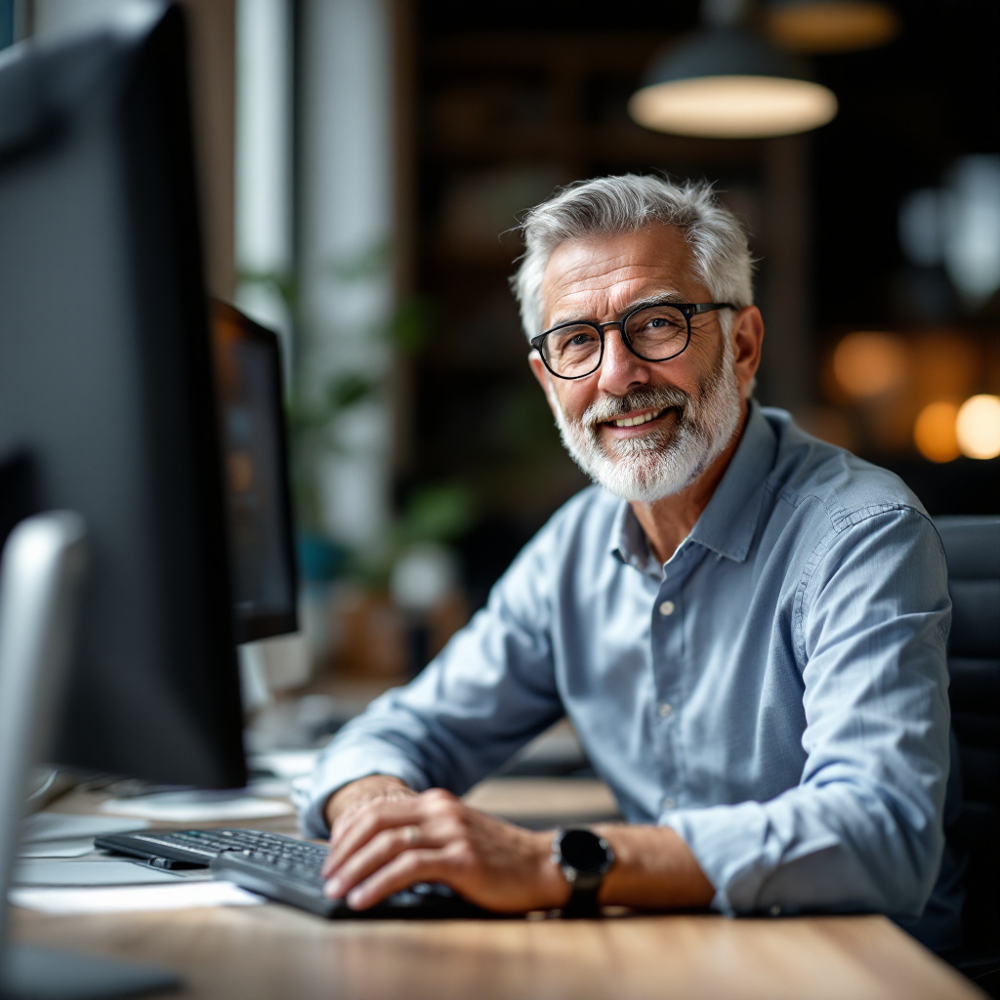

In [8]:
img = Image.open(imagefile)
img

## Human

In [9]:
prompts = [
    "A professional headshot of a 30-year-old man with curly auburn hair, wearing a navy blazer, soft studio lighting, shot with Canon 5D Mark IV, 85mm lens, shallow depth of field",
    "A professional headshot of a 30-year-old woman with blond hair, wearing a pink blazer, soft studio lighting, shot with Canon 5D Mark IV, 85mm lens, shallow depth of field",
    "Close-up portrait of a child with bright, vivid emotions, their eyes wide and sparkling with joy, a genuine, infectious smile spreading across their face. The sunlight dances on their features, highlighting the rosy cheeks and creating a warm, radiant glow. The background is slightly out of focus, enhancing the child's exuberant expression and the feeling of pure, unfiltered happiness",
    "Capture the fleeting moment when strangers share a spontaneous laugh at a street corner in a bustling city. Focus on the joyful expressions, diverse clothing styles, and the vibrant, textured background of urban graffiti and bustling pedestrians. Use a Canon EOS R5 at 1/500s, f/2.8, ISO 400 to capture the motion and emotion vividly. The atmosphere should convey the energy and diversity of city life, with the warm hues of a setting sun casting long shadows",
    "Capture a dramatic image of shadows cast by a human figure against an ornate brick wall. Use a DSLR camera with a 50mm lens, set to f/1.8 for a shallow depth of field, and ISO 100 to reduce noise. Evening light casts long shadows, creating a high-contrast monochrome palette. The atmosphere is moody with an emphasis on geometric shapes and patterns",
    "A portrait of a fisherman working on a dock, with a harbor in the background. Capture the atmosphere of the working environment."
]

print("\n" + "=" * 60)
print("🔍 TESTING HUMAN PHOTOREALISM CAPABILITIES")
print("=" * 60)

for i, prompt in enumerate(prompts, 1):
    generate_image(prompt, f"human_{i}")
    time.sleep(5)  # Rate limiting


🔍 TESTING HUMAN PHOTOREALISM CAPABILITIES

🎨 Generating: human_1
📝 Text prompt: A professional headshot of a 30-year-old man with curly auburn hair, wearing a navy blazer, soft studio lighting, shot with Canon 5D Mark IV, 85mm lens, shallow depth of field
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/human_1_092211.png

🎨 Generating: human_2
📝 Text prompt: A professional headshot of a 30-year-old woman with blond hair, wearing a pink blazer, soft studio lighting, shot with Canon 5D Mark IV, 85mm lens, shallow depth of field
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/human_2_092223.png

🎨 Generating: human_3
📝 Text prompt: Close-up portrait of a child with bright, vivid emotions, their eyes wide and sparkling with joy, a genuine, infectious smile spreading across their face. The sunlight dances on their features, highlighting the rosy cheeks and creating a warm, radiant 

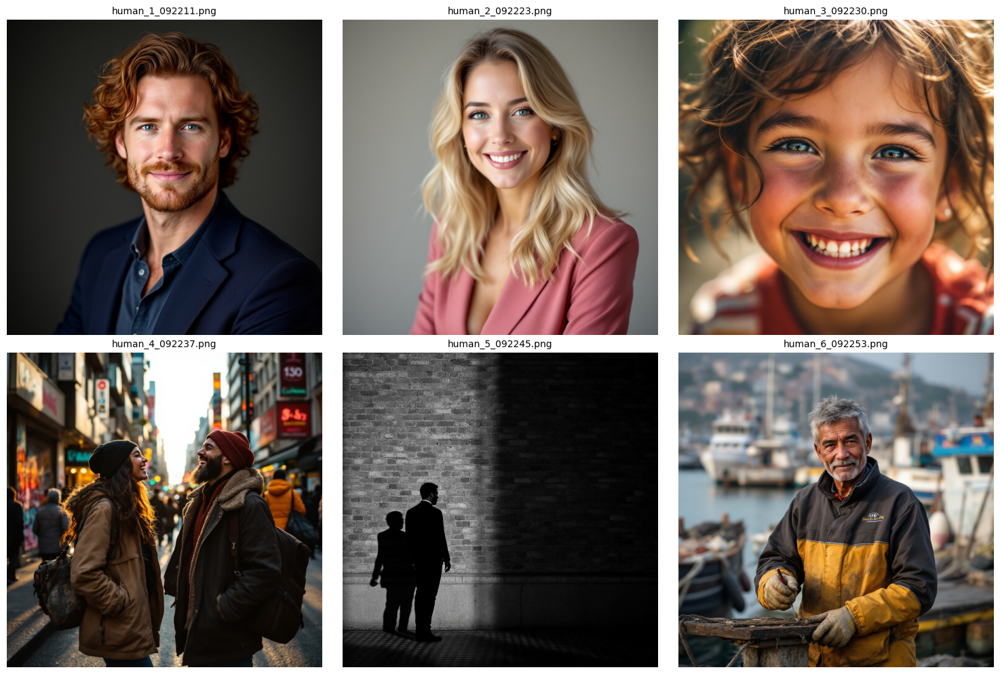

Displayed 6 images starting with 'human'


In [10]:
display_images(IMAGES_DIR, "human", figsize=(15, 10), cols=3)

### Photorealism

In [11]:
prompts = [
    "Ultra-realistic macro photograph of a dewdrop on a spider web at dawn, backlit by golden sunlight, extreme close-up, crystal clear detail, professional nature photography",
    "Photorealistic interior of a modern minimalist kitchen, marble countertops, brass fixtures, natural light streaming through large windows, architectural photography style",
    "A bustling urban street scene during the day, with a variety of cars parked and driving along a tree-lined avenue. The street is wet from recent rain, reflecting the vehicles and buildings. Pedestrians walk along the sidewalks, and modern buildings rise in the background. The atmosphere is lively and realistic, with natural lighting and detailed textures.",
    "A lively city street scene during the afternoon, filled with diverse groups of people walking, talking, and going about their day. Some are sitting at outdoor cafés, others are shopping or commuting. The buildings are modern with glass facades, and trees line the sidewalks. The lighting is natural, casting soft shadows, and the atmosphere feels vibrant and realistic.",   
    "A teenage girl of afghani descent with striking rainbow eyes stares at the camera with a deep read head scarf. Kodachrome film",
    "A portrait of a young computer engineer, sitting in front of a computer screen, working on a complex coding project. The engineer is a wearing a pair of glasses and a pair of headphones, and is surrounded by many computers’ equipment like keyboard, mouse, and monitor. The rooms is dimly lit with blue LED lights and the photograph is taken from a Sony Alpha 7 III camera with a prime lens set to F/2.8 and ISO set to 800.",
]

print("\n" + "=" * 60)
print("🔍 TESTING PHOTOREALISM CAPABILITIES")
print("=" * 60)

for i, prompt in enumerate(prompts, 1):
    generate_image(prompt, f"photorealism_{i}")
    time.sleep(5)  # Rate limiting


🔍 TESTING PHOTOREALISM CAPABILITIES

🎨 Generating: photorealism_1
📝 Text prompt: Ultra-realistic macro photograph of a dewdrop on a spider web at dawn, backlit by golden sunlight, extreme close-up, crystal clear detail, professional nature photography
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/photorealism_1_092302.png

🎨 Generating: photorealism_2
📝 Text prompt: Photorealistic interior of a modern minimalist kitchen, marble countertops, brass fixtures, natural light streaming through large windows, architectural photography style
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/photorealism_2_092309.png

🎨 Generating: photorealism_3
📝 Text prompt: A bustling urban street scene during the day, with a variety of cars parked and driving along a tree-lined avenue. The street is wet from recent rain, reflecting the vehicles and buildings. Pedestrians walk along the sidewalks, 

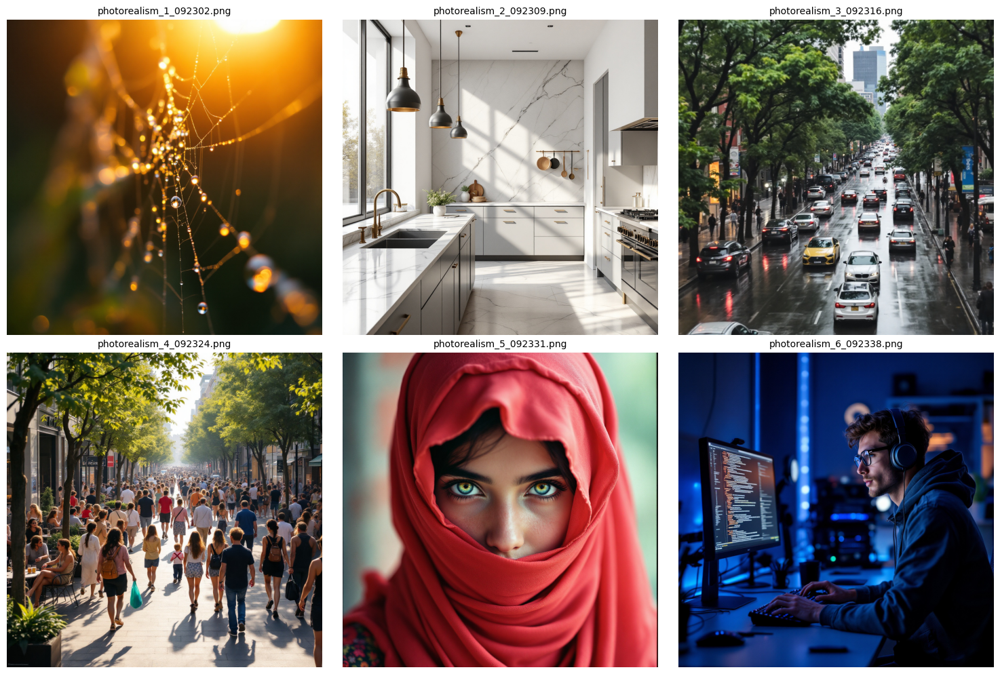

Displayed 6 images starting with 'photorealism'


In [12]:
display_images(IMAGES_DIR, "photorealism", figsize=(15, 10), cols=3)

## Style prompts

In [13]:
style_prompts = [
    ("Oil painting in the style of Van Gogh, swirling brushstrokes, vibrant colors, a field of sunflowers under a dramatic sky",
     "van_gogh_style"),
    ("Japanese ukiyo-e woodblock print style, cherry blossoms over a tranquil lake, Mount Fuji in background, traditional color palette",
     "ukiyo_e_style"),
    ("Watercolor painting, soft washes of color, paper texture visible, botanical illustration of exotic orchids, delicate and ethereal",
     "watercolor")
]

print("\n" + "=" * 60)
print("🎨 TESTING ARTISTIC STYLE CAPABILITIES")
print("=" * 60)

for prompt, prefix in style_prompts:
    generate_image(prompt, f"artistic_style_{i}")
    time.sleep(5)


🎨 TESTING ARTISTIC STYLE CAPABILITIES

🎨 Generating: artistic_style_6
📝 Text prompt: Oil painting in the style of Van Gogh, swirling brushstrokes, vibrant colors, a field of sunflowers under a dramatic sky
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/artistic_style_6_092348.png

🎨 Generating: artistic_style_6
📝 Text prompt: Japanese ukiyo-e woodblock print style, cherry blossoms over a tranquil lake, Mount Fuji in background, traditional color palette
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/artistic_style_6_092356.png

🎨 Generating: artistic_style_6
📝 Text prompt: Watercolor painting, soft washes of color, paper texture visible, botanical illustration of exotic orchids, delicate and ethereal
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/artistic_style_6_092403.png


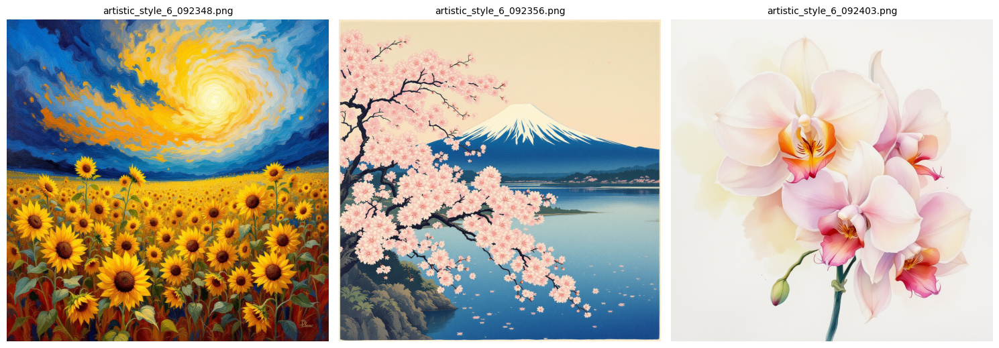

Displayed 3 images starting with 'artistic'


In [14]:
display_images(IMAGES_DIR, "artistic", figsize=(15, 10), cols=3)

## Complex prompts

In [15]:
complex_prompts = [
    "A bustling medieval marketplace, merchants selling colorful fabrics and spices, children playing, knights on horseback, detailed architecture with stone buildings, warm afternoon light, multiple characters with distinct clothing and expressions",
    "An underwater scene with a diverse coral reef, schools of tropical fish, a sea turtle swimming gracefully, rays of sunlight filtering through the water, vibrant colors, multiple layers of depth",
    "A steampunk workshop with intricate brass machinery, gears and pipes, an inventor working at a cluttered desk, Edison bulbs casting warm light, copper and bronze textures, detailed mechanical elements"
]

print("\n" + "=" * 60)
print("🔧 TESTING COMPLEX COMPOSITIONS")
print("=" * 60)

for i, prompt in enumerate(complex_prompts, 1):
    generate_image(prompt, f"complex_composition_{i}")
    time.sleep(5)


🔧 TESTING COMPLEX COMPOSITIONS

🎨 Generating: complex_composition_1
📝 Text prompt: A bustling medieval marketplace, merchants selling colorful fabrics and spices, children playing, knights on horseback, detailed architecture with stone buildings, warm afternoon light, multiple characters with distinct clothing and expressions
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/complex_composition_1_092412.png

🎨 Generating: complex_composition_2
📝 Text prompt: An underwater scene with a diverse coral reef, schools of tropical fish, a sea turtle swimming gracefully, rays of sunlight filtering through the water, vibrant colors, multiple layers of depth
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/complex_composition_2_092419.png

🎨 Generating: complex_composition_3
📝 Text prompt: A steampunk workshop with intricate brass machinery, gears and pipes, an inventor working at a clutte

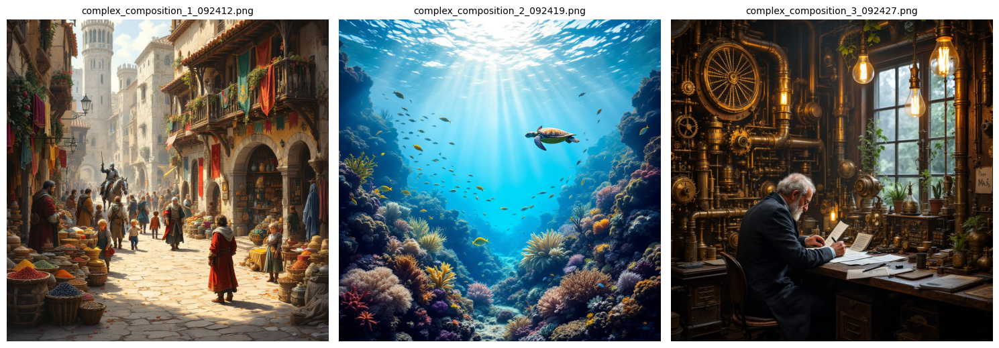

Displayed 3 images starting with 'complex'


In [16]:
display_images(IMAGES_DIR, "complex", figsize=(15, 10), cols=3)

## Lighting tests

In [17]:
lighting_tests = [
    ("Golden hour portrait of a person reading under an old oak tree, warm soft lighting, long shadows, magical atmosphere",
     "golden_hour"),
    ("Dramatic chiaroscuro lighting, a musician playing violin in a dark concert hall, single spotlight, high contrast",
     "chiaroscuro"),
    ("Soft window light illuminating a still life of fruits and flowers on a wooden table, gentle shadows",
     "window_light")
]

print("\n" + "=" * 60)
print("💡 TESTING LIGHTING CONDITIONS")
print("=" * 60)

for prompt, prefix in lighting_tests:
    generate_image(prompt, f"lighting_tests_{i}")
    time.sleep(5)


💡 TESTING LIGHTING CONDITIONS

🎨 Generating: lighting_tests_3
📝 Text prompt: Golden hour portrait of a person reading under an old oak tree, warm soft lighting, long shadows, magical atmosphere
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/lighting_tests_3_092435.png

🎨 Generating: lighting_tests_3
📝 Text prompt: Dramatic chiaroscuro lighting, a musician playing violin in a dark concert hall, single spotlight, high contrast
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/lighting_tests_3_092443.png

🎨 Generating: lighting_tests_3
📝 Text prompt: Soft window light illuminating a still life of fruits and flowers on a wooden table, gentle shadows
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/lighting_tests_3_092450.png


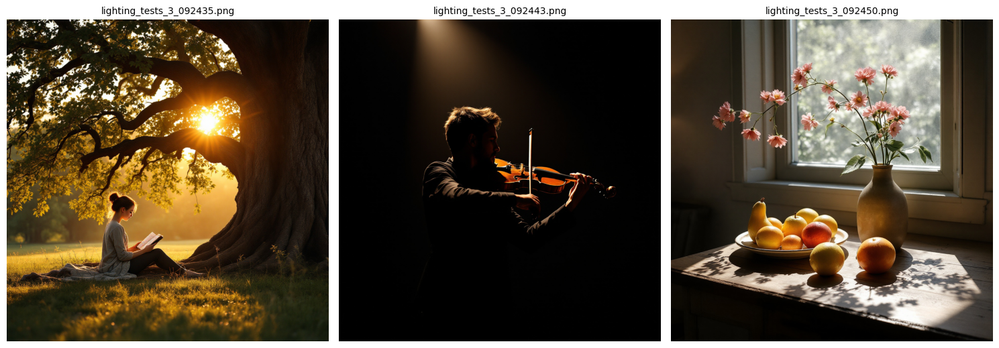

Displayed 3 images starting with 'lighting'


In [18]:
display_images(IMAGES_DIR, "lighting", figsize=(15, 10), cols=3)

## Text prompts

In [19]:
text_prompts = [
    "A vintage poster with the text 'GRAND OPENING' in bold art deco lettering, decorative borders, 1920s style design",
    "A modern book cover design with the title 'Microsoft Azure' in sleek typography, minimalist tech-inspired background",
    "A man wearning a white shirt with 'I love Azure' written on it",
]

print("\n" + "=" * 60)
print("📝 TESTING TEXT INTEGRATION")
print("=" * 60)

for i, prompt in enumerate(text_prompts, 1):
    generate_image(prompt, f"text_integration_{i}")
    time.sleep(5)


📝 TESTING TEXT INTEGRATION

🎨 Generating: text_integration_1
📝 Text prompt: A vintage poster with the text 'GRAND OPENING' in bold art deco lettering, decorative borders, 1920s style design
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/text_integration_1_092458.png

🎨 Generating: text_integration_2
📝 Text prompt: A modern book cover design with the title 'Microsoft Azure' in sleek typography, minimalist tech-inspired background
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/text_integration_2_092505.png

🎨 Generating: text_integration_3
📝 Text prompt: A man wearning a white shirt with 'I love Azure' written on it
⚙️ Parameters: {
  "output_format": "png",
  "n": 1,
  "size": "1024x1024"
}
✅ OK. Image saved: images/text_integration_3_092512.png


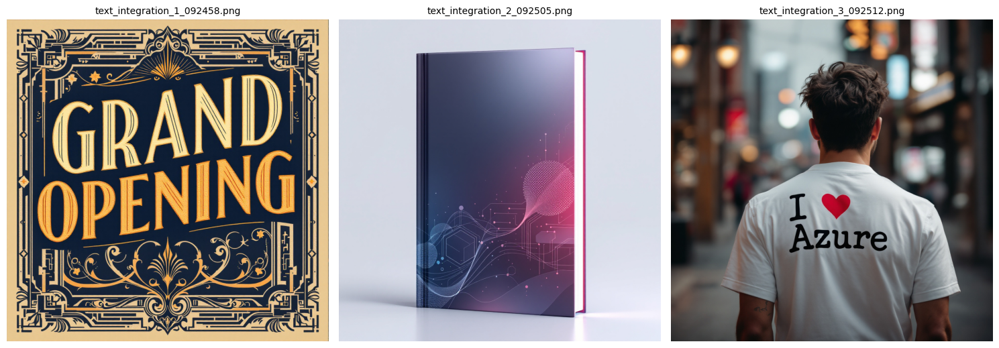

Displayed 3 images starting with 'text'


In [20]:
display_images(IMAGES_DIR, "text", figsize=(15, 10), cols=3)

In [22]:
!zip -r images.zip $IMAGES_DIR

updating: images/ (stored 0%)
  adding: images/.ipynb_checkpoints/ (stored 0%)
  adding: images/.ipynb_checkpoints/artistic_style_6_092356-checkpoint.png (deflated 1%)
  adding: images/.ipynb_checkpoints/artistic_style_6_092403-checkpoint.png (deflated 1%)
  adding: images/.ipynb_checkpoints/complex_composition_1_092412-checkpoint.png (deflated 0%)
  adding: images/.ipynb_checkpoints/human_4_092237-checkpoint.png (deflated 1%)
  adding: images/.ipynb_checkpoints/photorealism_3_092316-checkpoint.png (deflated 1%)
  adding: images/.ipynb_checkpoints/text_integration_3_092512-checkpoint.png (deflated 1%)
  adding: images/artistic_style_6_092348.png (deflated 0%)
  adding: images/artistic_style_6_092356.png (deflated 1%)
  adding: images/artistic_style_6_092403.png (deflated 1%)
  adding: images/complex_composition_1_092412.png (deflated 0%)
  adding: images/complex_composition_2_092419.png (deflated 0%)
  adding: images/complex_composition_3_092427.png (deflated 1%)
  adding: images/human